In [1]:
import pandas as pd
from bs4 import BeautifulSoup
import requests
import re
import pandas as pd
import numpy as np

In [2]:
#important to put the cabecalho as headers to show the website it isn't a robot
cabecalho = {'user-agent' : 'Mozilla/5.0'}
site = requests.get('https://www.belezanaweb.com.br/cabelos/tipos-de-cabelo/cacheados-ou-ondulados/',
                   headers = cabecalho)
site.text


'<!DOCTYPE html>\n<html dir="ltr" lang="pt-br" class="">\n  <head>\n    <meta charset="UTF-8"/>\n    <base href="/"><meta name="description"\n    content="Produtos para Cabelos Cacheados e Ondulados: fios definidos e livres do frizz. Melhores Produtos para Cacheados na BLZ." />\n    <link rel="canonical" href="https://www.belezanaweb.com.br/cabelo cacheado, creme para cabelo cacheado, produtos para cabelos cacheados, produtos para cabelo ondulado/" />\n    \n\n\n<meta name="robots" content="index, follow" />\n\n<meta name="rating" content="general" />\n\n<meta name="viewport" content="width=device-width,initial-scale=1.0" />\n\n<meta http-equiv="X-UA-Compatible" content="IE=edge" />\n<meta name="HandheldFriendly" content="True" />\n\n<meta name="apple-mobile-web-app-capable" content="yes" />\n<meta name="apple-mobile-web-app-status-bar-style" content="black-translucent" />\n<meta name="apple-mobile-web-app-title" content="Beleza na Web">\n<meta name="mobile-web-app-capable" content="ye

In [3]:
#testing the answer if it's ok to go foward
site

<Response [200]>

In [4]:
soup_1 = site.text
soup_1

'<!DOCTYPE html>\n<html dir="ltr" lang="pt-br" class="">\n  <head>\n    <meta charset="UTF-8"/>\n    <base href="/"><meta name="description"\n    content="Produtos para Cabelos Cacheados e Ondulados: fios definidos e livres do frizz. Melhores Produtos para Cacheados na BLZ." />\n    <link rel="canonical" href="https://www.belezanaweb.com.br/cabelo cacheado, creme para cabelo cacheado, produtos para cabelos cacheados, produtos para cabelo ondulado/" />\n    \n\n\n<meta name="robots" content="index, follow" />\n\n<meta name="rating" content="general" />\n\n<meta name="viewport" content="width=device-width,initial-scale=1.0" />\n\n<meta http-equiv="X-UA-Compatible" content="IE=edge" />\n<meta name="HandheldFriendly" content="True" />\n\n<meta name="apple-mobile-web-app-capable" content="yes" />\n<meta name="apple-mobile-web-app-status-bar-style" content="black-translucent" />\n<meta name="apple-mobile-web-app-title" content="Beleza na Web">\n<meta name="mobile-web-app-capable" content="ye

In [5]:
#showing the html more organized
soup_2 = BeautifulSoup(soup_1, 'html.parser')
soup_2


<!DOCTYPE html>

<html class="" dir="ltr" lang="pt-br">
<head>
<meta charset="utf-8"/>
<base href="/"/><meta content="Produtos para Cabelos Cacheados e Ondulados: fios definidos e livres do frizz. Melhores Produtos para Cacheados na BLZ." name="description"/>
<link href="https://www.belezanaweb.com.br/cabelo cacheado, creme para cabelo cacheado, produtos para cabelos cacheados, produtos para cabelo ondulado/" rel="canonical"/>
<meta content="index, follow" name="robots"/>
<meta content="general" name="rating"/>
<meta content="width=device-width,initial-scale=1.0" name="viewport"/>
<meta content="IE=edge" http-equiv="X-UA-Compatible"/>
<meta content="True" name="HandheldFriendly"/>
<meta content="yes" name="apple-mobile-web-app-capable"/>
<meta content="black-translucent" name="apple-mobile-web-app-status-bar-style"/>
<meta content="Beleza na Web" name="apple-mobile-web-app-title"/>
<meta content="yes" name="mobile-web-app-capable"/>
<meta content="1859355077624955" property="fb:app_id"

In [6]:
lista_item = soup_2.find_all('span', attrs ={'class':'showcase-item-brand'})                         
lista_item

[<span class="showcase-item-brand" data-href="https://www.belezanaweb.com.br/cadiveu-professional/">
             Cadiveu Professional
         </span>,
 <span class="showcase-item-brand" data-href="https://www.belezanaweb.com.br/widi-care/">
             Widi Care
         </span>,
 <span class="showcase-item-brand" data-href="https://www.belezanaweb.com.br/lola-cosmetics/">
             Lola From Rio
         </span>,
 <span class="showcase-item-brand" data-href="https://www.belezanaweb.com.br/arvensis-cos-nat/">
             Arvensis Cosméticos Naturais
         </span>,
 <span class="showcase-item-brand" data-href="https://www.belezanaweb.com.br/wella-professionals/">
             Wella Professionals
         </span>,
 <span class="showcase-item-brand" data-href="https://www.belezanaweb.com.br/brae/">
             Braé
         </span>,
 <span class="showcase-item-brand" data-href="https://www.belezanaweb.com.br/lola-cosmetics/">
             Lola From Rio
         </span>,
 <span 

In [7]:
for produto in lista_item:
    nome_item = produto.contents[0]
    print(nome_item) 
    


            Cadiveu Professional
        

            Widi Care
        

            Lola From Rio
        

            Arvensis Cosméticos Naturais
        

            Wella Professionals
        

            Braé
        

            Lola From Rio
        

            Lowell
        

            Widi Care
        

            Mahair Cosmetics
        

            Braé
        

            Lola From Rio
        

            John Frieda
        

            Widi Care
        

            Wella Professionals
        

            Braé
        

            Lola From Rio
        

            Lowell
        

            Wella Professionals
        

            Sebastian Professional
        

            Arvensis Cosméticos Naturais
        

            Lola From Rio
        

            L'Oréal Professionnel
        

            Griffus
        

            Braé
        

            Wella Professionals
        

            Lola From Rio
        

            Deva

In [8]:
len(nome_item)

35

In [9]:
lista_preco = soup_2.find_all('span', {'class':'price-value'})
lista_preco

[<span class="price-value">R$ 26,90</span>,
 <span class="price-value">R$ 54,80</span>,
 <span class="price-value">R$ 30,49</span>,
 <span class="price-value">R$ 53,00</span>,
 <span class="price-value">R$ 78,90</span>,
 <span class="price-value">R$ 165,90</span>,
 <span class="price-value">R$ 79,80</span>,
 <span class="price-value">R$ 74,90</span>,
 <span class="price-value">R$ 41,90</span>,
 <span class="price-value">R$ 18,90</span>,
 <span class="price-value">R$ 52,80</span>,
 <span class="price-value">R$ 27,90</span>,
 <span class="price-value">R$ 49,90</span>,
 <span class="price-value">R$ 54,90</span>,
 <span class="price-value">R$ 84,90</span>,
 <span class="price-value">R$ 62,00</span>,
 <span class="price-value">R$ 24,90</span>,
 <span class="price-value">R$ 59,57</span>,
 <span class="price-value">R$ 436,80</span>,
 <span class="price-value">R$ 200,90</span>,
 <span class="price-value">R$ 93,49</span>,
 <span class="price-value">R$ 72,80</span>,
 <span class="price-value">R$

In [10]:
for preco in lista_preco:
    valor_item = preco.contents[0].text
    print(valor_item)

R$ 26,90
R$ 54,80
R$ 30,49
R$ 53,00
R$ 78,90
R$ 165,90
R$ 79,80
R$ 74,90
R$ 41,90
R$ 18,90
R$ 52,80
R$ 27,90
R$ 49,90
R$ 54,90
R$ 84,90
R$ 62,00
R$ 24,90
R$ 59,57
R$ 436,80
R$ 200,90
R$ 93,49
R$ 72,80
R$ 247,90
R$ 41,70
R$ 52,90
R$ 197,90
R$ 19,90
R$ 84,80
R$ 122,70
R$ 30,90
R$ 9,90
R$ 41,90
R$ 40,90
R$ 54,90
R$ 28,90
R$ 37,90


In [28]:
produto_cabelo = []
for produto, preco in zip (lista_item, lista_preco):
    nome_item = produto.contents[0].text
    valor_item = preco.contents[0].text
    valor_item = valor_item.replace('R$',"").replace(",",".").replace(" ","")
    nome_item = nome_item.replace('\n', '')
    
    produto_cabelo.append((nome_item, valor_item))

produto_cabelo
    

[('            Cadiveu Professional        ', '26.90'),
 ('            Widi Care        ', '54.80'),
 ('            Lola From Rio        ', '30.49'),
 ('            Arvensis Cosméticos Naturais        ', '53.00'),
 ('            Wella Professionals        ', '78.90'),
 ('            Braé        ', '165.90'),
 ('            Lola From Rio        ', '79.80'),
 ('            Lowell        ', '74.90'),
 ('            Widi Care        ', '41.90'),
 ('            Mahair Cosmetics        ', '18.90'),
 ('            Braé        ', '52.80'),
 ('            Lola From Rio        ', '27.90'),
 ('            John Frieda        ', '49.90'),
 ('            Widi Care        ', '54.90'),
 ('            Wella Professionals        ', '84.90'),
 ('            Braé        ', '62.00'),
 ('            Lola From Rio        ', '24.90'),
 ('            Lowell        ', '59.57'),
 ('            Wella Professionals        ', '436.80'),
 ('            Sebastian Professional        ', '200.90'),
 ('            Arven

In [29]:
df_produtos = pd.DataFrame(produto_cabelo, columns = ['Produto', 'Valor'])
df_produtos


,Produto,Valor
0,Cadiveu Professional,26.90
1,Widi Care,54.80
2,Lola From Rio,30.49
3,Arvensis Cosméticos Naturais,53.00
4,Wella Professionals,78.90
5,Braé,165.90
6,Lola From Rio,79.80
7,Lowell,74.90
8,Widi Care,41.90
9,Mahair Cosmetics,18.90


In [34]:
df_produtos.dtypes

Produto    object
Valor      object
dtype: object

In [39]:
df_produtos['Valor'] = df_produtos['Valor'].astype(float)

In [40]:
df_produtos['Valor'] = df_produto_cabelo['Valor'].astype(np.float32)
df_produto_cabelo.dtypes

Produto     object
Valor      float32
dtype: object

In [41]:
df_produtos.describe()

,Valor
count,36.000000
mean,79.429146
std,81.981163
min,9.900000
25%,36.150001
50%,53.900000
75%,81.050003
max,436.799988


In [42]:
import matplotlib.pyplot as plt

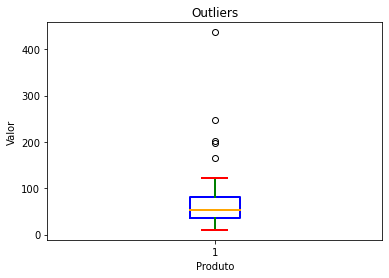

In [56]:
fig, ax = plt.subplots()

# Boxplot design
boxprops = dict(color='blue', linewidth=2)
medianprops = dict(color='orange', linewidth=2)
whiskerprops = dict(color='green', linewidth=2)
capprops = dict(color='red', linewidth=2)

ax.boxplot(df_produtos['Valor'], 
           boxprops=boxprops, 
           medianprops=medianprops, 
           whiskerprops=whiskerprops, 
           capprops=capprops)

# Set labels and title
ax.set_xlabel('Produto')
ax.set_ylabel('Valor')
ax.set_title('Outliers')

# Customize tick labels if needed
# ax.set_xticklabels(['Label1', 'Label2', 'Label3'])

# Show the plot
plt.show()